# Menu <a class="anchor" id="menu"></a>

* [1. Inialize](#init)
* [2. Preprocessing](#preprocessing)
    * [2.1 `Preprocessing #1`: various transformations **without Canny** edges filter](#preprocessing1)
    * [2.2 `Preprocessing #2`: only **Canny** edges filter](#preprocessing2)
* [3. Features extraction with *ORB* on images from `Preprocessing #1` **(non canny)** ](#feature_extraction1)
    * [3.1 `Feature extraction` and image descriptors calculation](#fe_preprocessing1)
    * [3.2 Display `matching` descriptors](#dm_preprocessing1)
    * [3.3 Display `NON matching` descriptors](#dnm_preprocessing1)
* [4. Features extraction with *ORB* on images from `Preprocessing #2` **(canny)* ](#feature_extraction2)
    * [4.1 `Feature extraction` and image descriptors calculation](#fe_preprocessing2)
    * [4.2 Display `matching` descriptors](#dm_preprocessing2)
    * [4.3 Display `NON matching` descriptors](#dnm_preprocessing2)

---
---
# 1. Initialize <a class="anchor" id="init"></a> [⇪](#menu)

In [1]:
import os
import shutil
import pathlib

import numpy as np
import cv2
from PIL import Image, ImageFilter, ImageOps, ImageDraw
import matplotlib.pyplot as plt
from matplotlib import gridspec

random_seed = 0
cmap_ref = 'nipy_spectral'

## 1.1 Prepare the list of pictures to load <a class="anchor" id="select_pictures"></a> [⇪](#menu)

In [2]:
img_indexes = ["01", "18", "101", "118"]

def generate_image_list(indexes):
    
    ret_before = []
    ret_after = []
    
    for i in indexes:
        ret_before.append( f'{i}_before')
        ret_after.append( f'{i}_after')
        
    return ret_before, ret_after, sorted(ret_before + ret_after)
    
img_before, img_after, img_full = generate_image_list(img_indexes)

print("before:", img_before)
print("after:", img_after)
print("full:", img_full)

before: ['01_before', '18_before', '101_before', '118_before']
after: ['01_after', '18_after', '101_after', '118_after']
full: ['01_after', '01_before', '101_after', '101_before', '118_after', '118_before', '18_after', '18_before']


---
---
# 2. Preprocessing <a class="anchor" id="preprocessing"></a> [⇪](#menu)

#### Let's prepare a folder to store the preprocessed images
(for the moment, we will remove it if it already exists, so that any modification of the pre-processing is taken into account)

In [3]:
initial_path = pathlib.Path('data')
preprocessed_path = pathlib.Path('data', 'preprocessed')

In [4]:
if os.path.exists(preprocessed_path):
    for file in  os.listdir(preprocessed_path):
        os.remove(pathlib.Path(preprocessed_path, file))
    os.rmdir(preprocessed_path)

In [5]:
os.mkdir(preprocessed_path)

## 2.1 `Preprocessing #1`: various transformations **without Canny** edges filter<a class="anchor" id="preprocessing1"></a> [⇪](#menu)

#### Let's define a preprocessing function

In [6]:
def pre_processing(img_path, param_blur, newsize, name):

    img = Image.open(img_path)
    
    # Gray
    #gray_img = ImageOps.grayscale(img)
    
    # Blur
    #blured_img = gray_img.filter(ImageFilter.BoxBlur(param_blur))
    blured_img = img.filter(ImageFilter.BoxBlur(param_blur))
    
    # Equalize
    equalized_img = ImageOps.equalize(blured_img)
    
    # Resize
    final_img = equalized_img.resize(newsize)
    
    # Save image
    export_path = pathlib.Path(preprocessed_path, f"{name}.jpg")
    final_img.save(export_path)

    
    print(img_path, name.upper())
    fig = plt.figure(figsize=(20,7), facecolor='lightgray')
        
    #steps_show=[img, gray_img, blured_img, equalized_img, final_img]
    steps_show=[img, blured_img, equalized_img, final_img]
    #steps_name=["source", "grey", "blured", "equalized", "resized"]
    steps_name=["source", "blured", "equalized", "resized"]
        
    spec = gridspec.GridSpec(
                    ncols=len(steps_show), nrows=2,
                    width_ratios=[1]*len(steps_show), wspace=0.3,
                    hspace=0.3, height_ratios=[5, 2]
                    )
        
    for i, image in enumerate(steps_show):

        fig.add_subplot(spec[i])
        plt.title(steps_name[i])
        plt.imshow(image, cmap='gray', vmin=0, vmax=255)
        plt.axis('off')

        fig.add_subplot(spec[i+len(steps_show)])
        mat = np.array(image)
        plt.title("Histogramme de l'image")
        plt.hist(mat.flatten(), bins=range(256))
        plt.xlabel('Intensité')
        plt.ylabel('Nombre de pixels')

    plt.show()

#### Let's apply the preprocessing on the selected images

data/01_after.jpg 01_AFTER


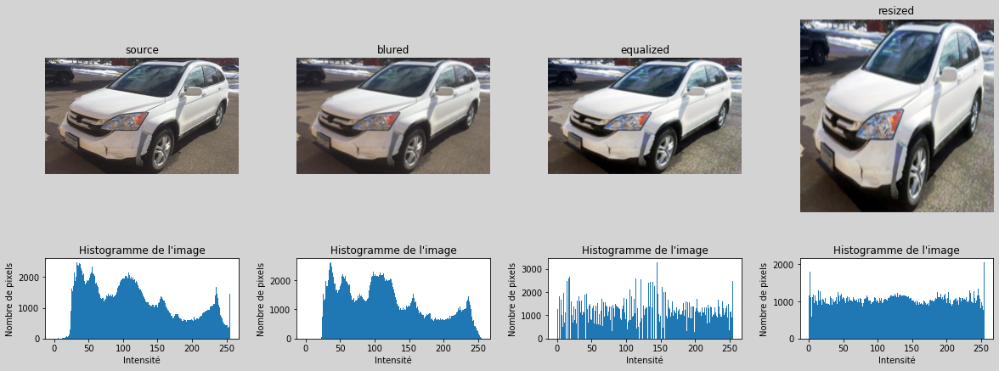

data/01_before.jpg 01_BEFORE


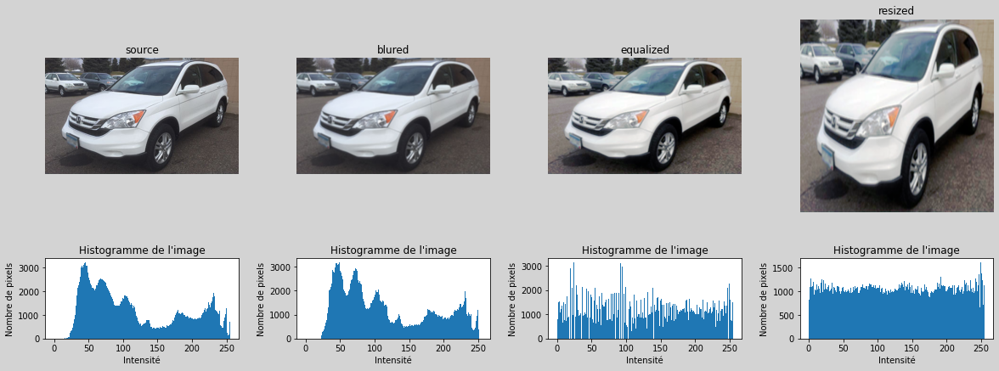

data/101_after.jpg 101_AFTER


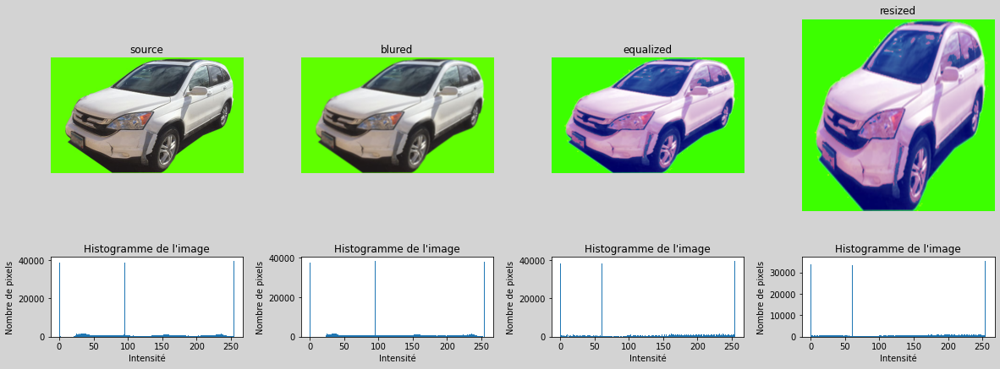

data/101_before.jpg 101_BEFORE


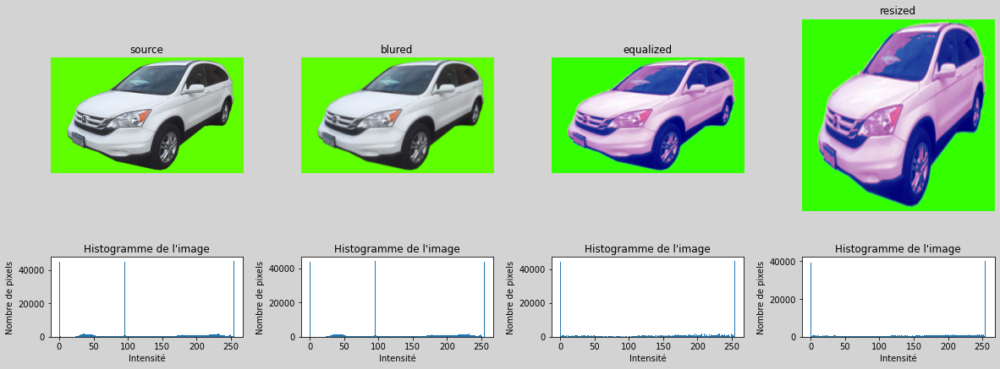

data/118_after.jpg 118_AFTER


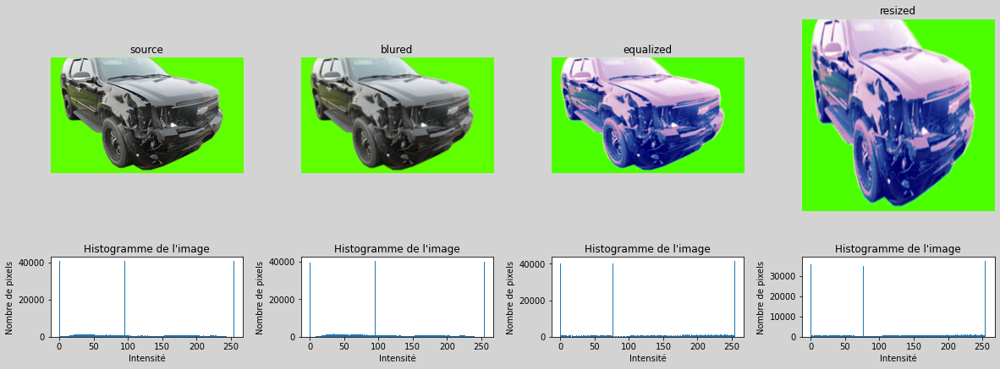

data/118_before.jpg 118_BEFORE


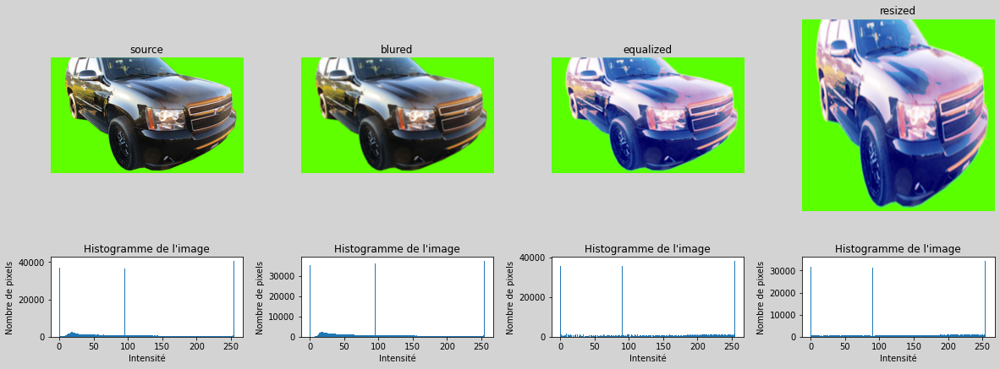

data/18_after.jpg 18_AFTER


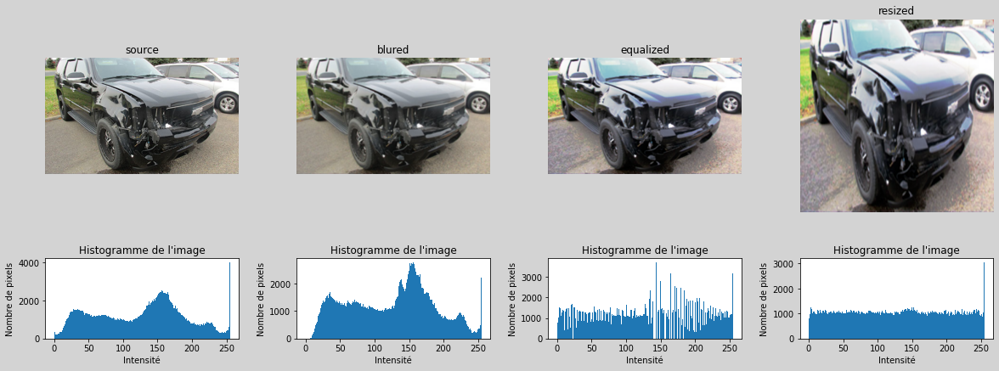

data/18_before.jpg 18_BEFORE


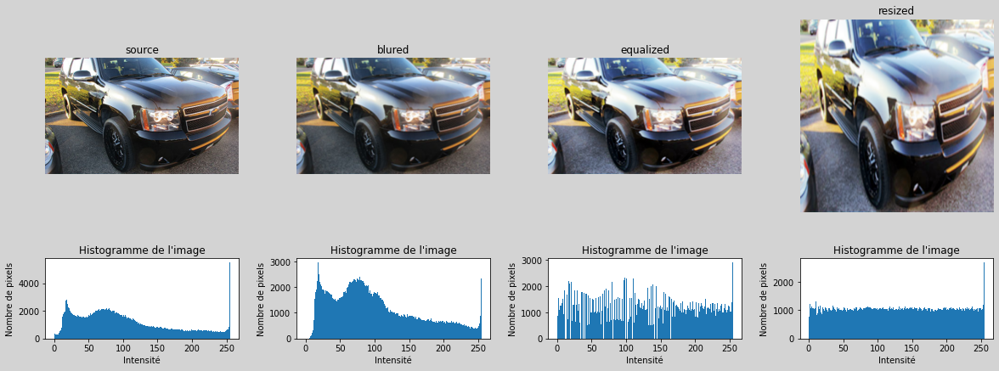

In [7]:
for image_name in img_full:
    image_path = pathlib.Path(initial_path, f'{image_name}.jpg')
    pre_processing(image_path, param_blur=1, newsize=(300,300), name=image_name)

## 2.2 `Preprocessing #2`: only **Canny** edges filter<a class="anchor" id="preprocessing2"></a> [⇪](#menu)

#### Let's prepare a canny version of our pictures

In [8]:
def pre_processing2(img_path, name):

    #img = Image.open(img_path)
    
    img = cv2.imread(str(img_path),0)
    edges = cv2.Canny(img,0,250)
    
    # Save image
    export_path = pathlib.Path(preprocessed_path, f"{name}_canny.jpg")
    cv2.imwrite(str(export_path), edges)
    
    fig = plt.figure(figsize=(20,7), facecolor='lightgray')
    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()

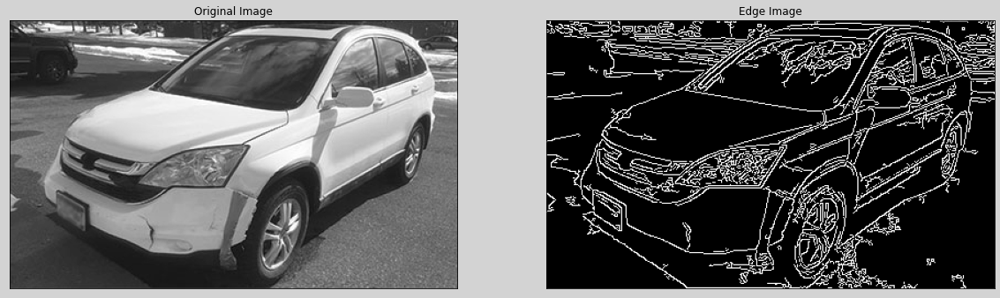

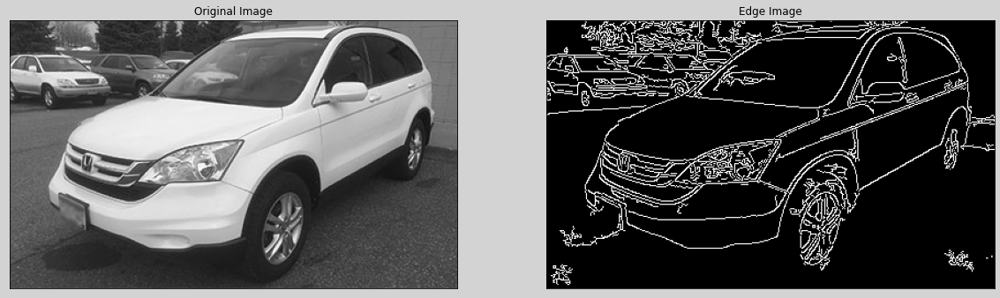

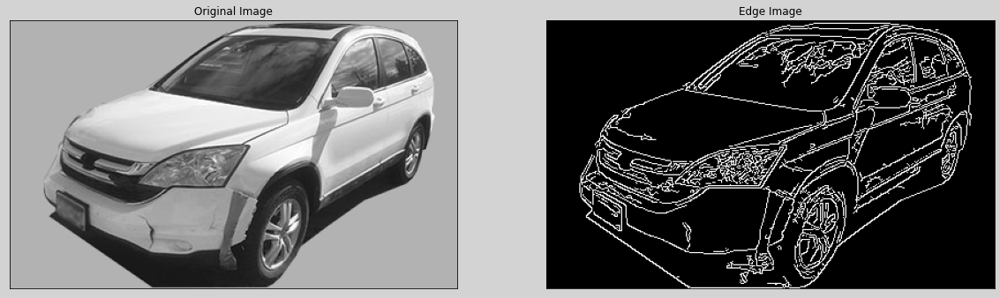

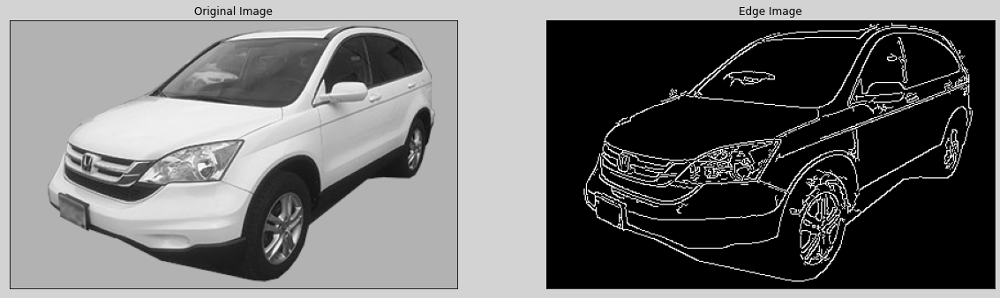

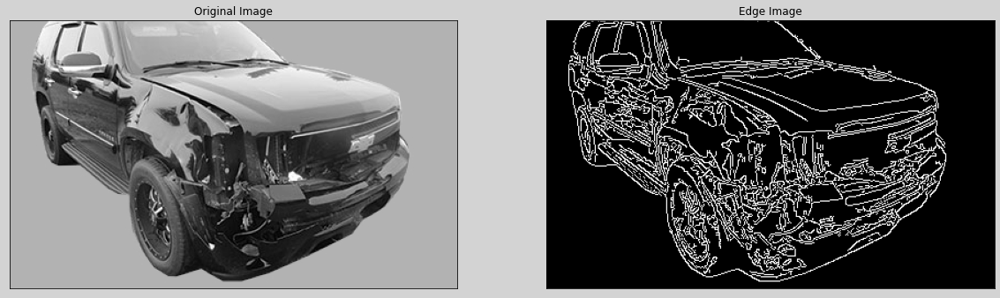

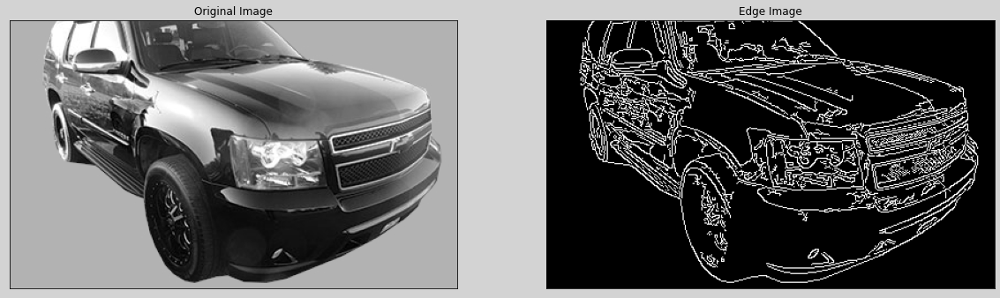

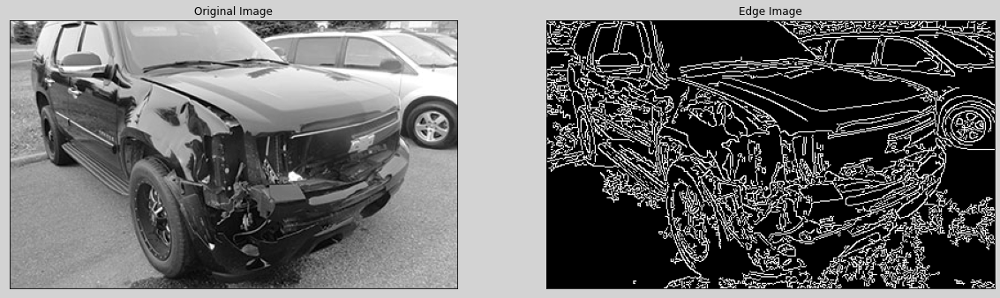

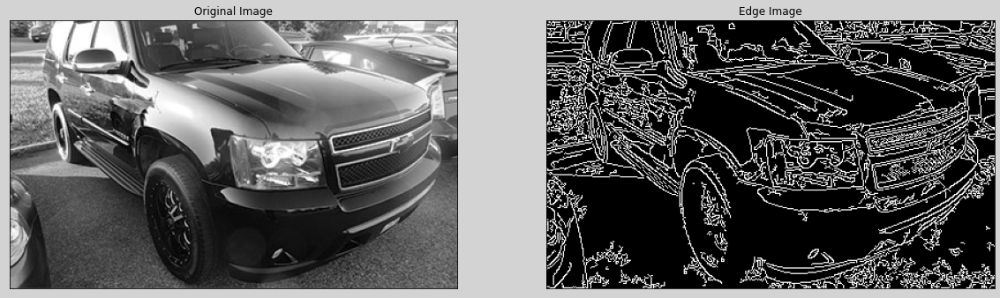

In [9]:
for image_name in img_full:
    image_path = pathlib.Path(initial_path, f'{image_name}.jpg')
    pre_processing2(str(image_path), name=image_name)

---
---
# 3. Features extraction with *ORB* on images from `Preprocessing #1` **(non canny)** <a class="anchor" id="feature_extraction1"></a> [⇪](#menu)

The first step in building a "bag of visual words" is to perform feature extraction and calculate descriptors for each image in the dataset. A descriptor is a vector that describes the neighborhood of the feature it is associated with. It is used to identify pairs of features that are most similar in two images. To facilitate this matching step (e.g. k-means), the descriptor should have many invariant properties (rotation, scale, illumination, and to some extent affine variations). Therefore, descriptors of two identical features with a slight geometric or photometric change should be as close as possible. The matching step then consists of comparing the descriptors.

One of the most well-known algorithms is `SIFT` *(Scale Invariant Feature Transform)*, but others exist such as `SURF` *(Speeded Up Robust Feature)*, `BRIEF` *(Binary Robust Independent Elementary Features)*, or `ORB` *(ORiented BRIEF)*. These algorithms convert each patch into a vector of n dimensions, and after this step, each image is a collection of vectors of the same dimension (128 for SIFT), where the order of the different vectors doesn't matter.

<img src="medias/bovw_extract_features.png" width="400">

#### Let's initialize the feature extractors (we will try ORB because we can freely use it everywhere, which isn't the case of SWIFT for instance)

In [10]:
max_features = 100

# Initialize the ORB / SIFT detector algorithm
orb = cv2.ORB_create(nfeatures=max_features, patchSize=25)
sift = cv2.SIFT_create(nfeatures=max_features) # patchSize is fixed in code (size=12σ×12σ)

## 3.1 Feature `extraction` and image descriptors calculation <a class="anchor" id="fe_preprocessing1"></a> [⇪](#menu)

01
index: 01 | img_before: data/preprocessed/01_before.jpg | img_after: data/preprocessed/01_after.jpg


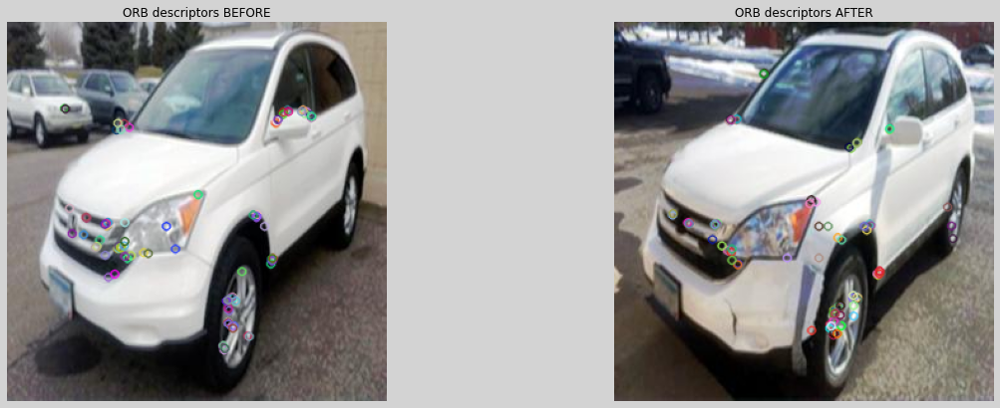

18
index: 18 | img_before: data/preprocessed/18_before.jpg | img_after: data/preprocessed/18_after.jpg


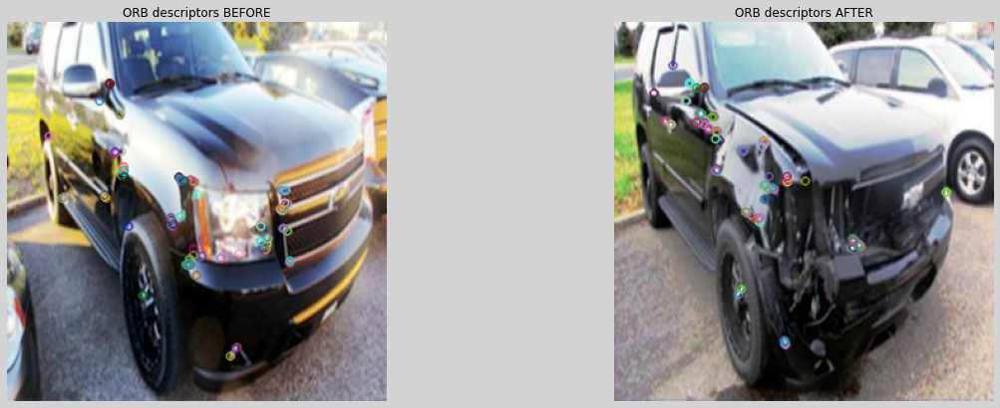

101
index: 101 | img_before: data/preprocessed/101_before.jpg | img_after: data/preprocessed/101_after.jpg


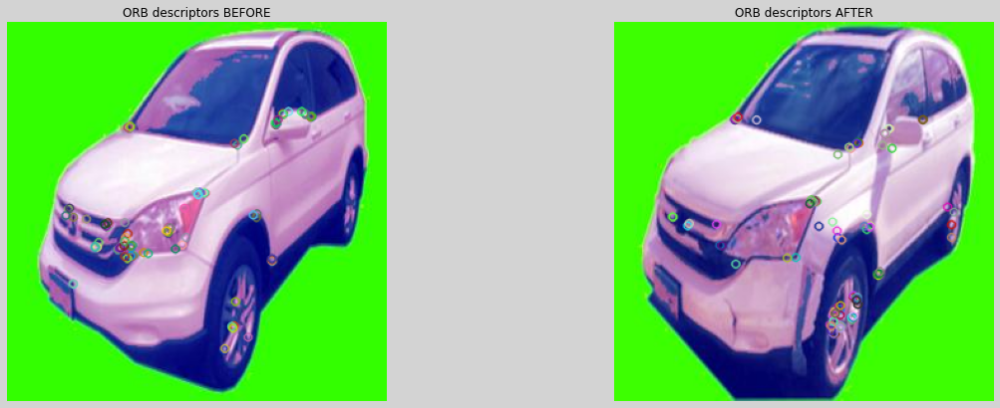

118
index: 118 | img_before: data/preprocessed/118_before.jpg | img_after: data/preprocessed/118_after.jpg


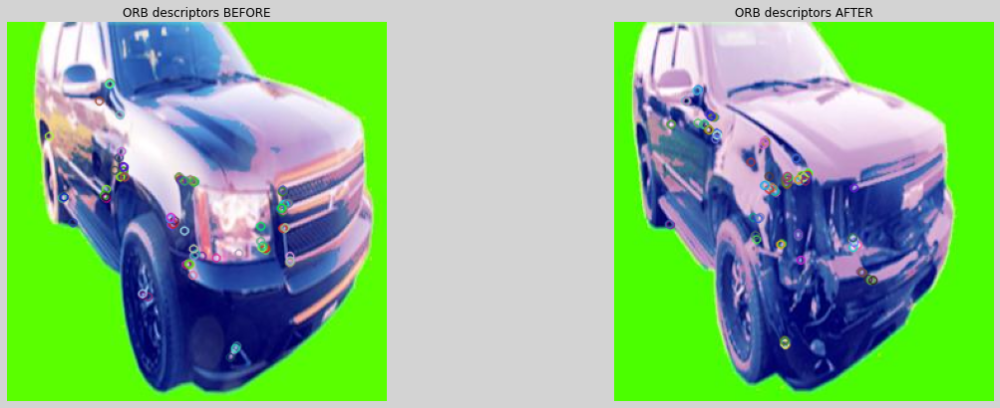

In [11]:
des_list_ORB =[]

for i in img_indexes:
    print(i)
    
    # -- IMG Before
    img_before_path = pathlib.Path(preprocessed_path, f"{i}_before.jpg")
    img_before = Image.open(img_before_path)
    
    mat_before = np.array(img_before)
    queryKeypointsORB_before, queryDescriptorsORB_before = orb.detectAndCompute(mat_before,None)
    
    # -- IMG After
    img_after_path = pathlib.Path(preprocessed_path, f"{i}_after.jpg")
    img_after = Image.open(img_after_path)
    
    mat_after = np.array(img_after)
    queryKeypointsORB_after, queryDescriptorsORB_after = orb.detectAndCompute(mat_after,None)
    
    # -- Store data
    des_list_ORB.append({'id':i, 'before':{'kp':queryKeypointsORB_before, 'desc':queryDescriptorsORB_before}, 'after':{'kp':queryKeypointsORB_after, 'desc':queryDescriptorsORB_after}})
    
    print(f"index: {i} | img_before: {img_before_path} | img_after: {img_after_path}")
    fig = plt.figure(figsize=(20,7), facecolor='lightgray')
        
    # -- Draw
    
    # draw only keypoints location,not size and orientation
    plt.subplot(1,2,1)
    plt.title("ORB descriptors BEFORE")
    #img_orb1 = cv2.drawKeypoints(mat, queryKeypointsORB_before, None, color=(0,255,0), flags=0)
    img_orb1 = cv2.drawKeypoints(mat_before, queryKeypointsORB_before, None, flags=2) #cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_orb1)
    plt.axis('off')
        
    plt.subplot(1,2,2)
    plt.title("ORB descriptors AFTER")
    #img_orb2 = cv2.drawKeypoints(mat, queryKeypointsORB_after, None, color=(0,255,0), flags=0)
    img_orb2 = cv2.drawKeypoints(mat_after, queryKeypointsORB_after, None, flags=2) #cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_orb2)
    plt.axis('off')
        
    plt.show()

## 3.2 Display `matching` descriptors <a class="anchor" id="dm_preprocessing1"></a> [⇪](#menu)

In [12]:
# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

In [13]:
matches_list = []

for i, row in enumerate(des_list_ORB):
    matches = bf.match(des_list_ORB[i]['before']['desc'],des_list_ORB[i]['after']['desc'])
    # Sort them in the order of their distance.
    # matches = sorted(matches, key = lambda x:x.distance)
    matches_list.append(matches)

0 0


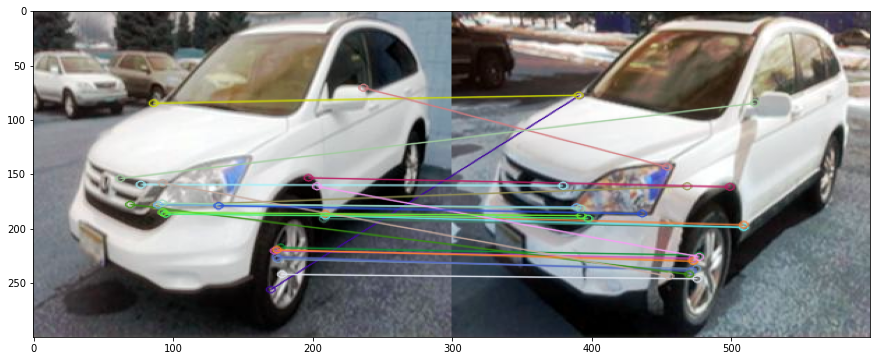

1 1


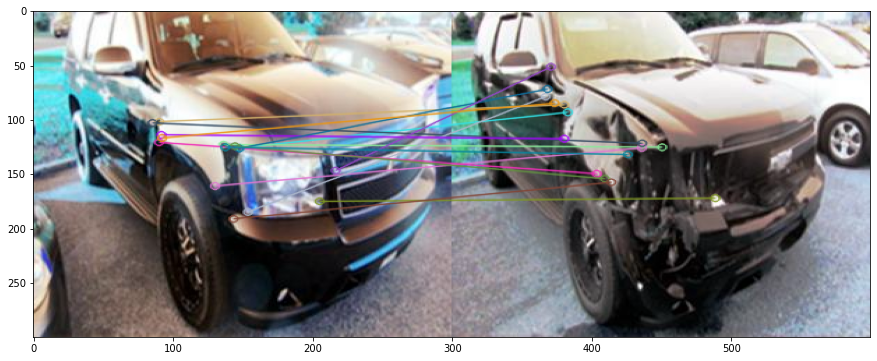

2 2


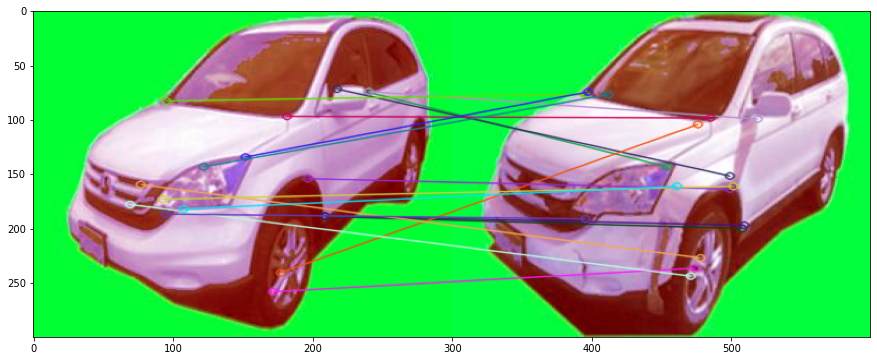

3 3


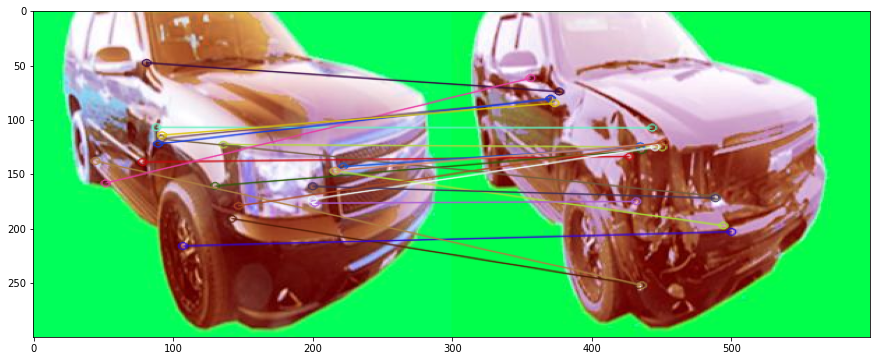

In [14]:
for i, j in enumerate(img_indexes):
    print(i, i)
    
    img_before = cv2.imread(str(pathlib.Path(preprocessed_path, f"{j}_before.jpg")))
    img_after = cv2.imread(str(pathlib.Path(preprocessed_path, f"{j}_after.jpg")))

    # Draw first 10 matches.
    img_similarities = cv2.drawMatches(img_before, des_list_ORB[i]['before']['kp'], img_after, des_list_ORB[i]['after']['kp'], matches_list[i][:100], None, flags=2)

    plt.figure(figsize = (15,6))
    plt.imshow(img_similarities, aspect='auto')
    plt.show()

## 3.2 Display `NON matching` descriptors <a class="anchor" id="dnm_preprocessing1"></a> [⇪](#menu)

In [81]:
def draw_non_matching_points( index, label, ORB_list, mod ):
    
    kp1_matched=([ ORB_list[index]['before']['kp'][x.trainIdx] for x in matches_list[index] ])
    kp2_matched=([ ORB_list[index]['after']['kp'][x.trainIdx] for x in matches_list[index] ])

    kp1_miss_matched=[kp for kp in ORB_list[index]['before']['kp'] if kp not in kp1_matched]
    kp2_miss_matched=[kp for kp in ORB_list[index]['after']['kp'] if kp not in kp2_matched]

    img_before = cv2.imread(str(pathlib.Path(preprocessed_path, f"{label}_before{mod}.jpg")))
    img_after = cv2.imread(str(pathlib.Path(preprocessed_path, f"{label}_after{mod}.jpg")))
    
    # draw only keypoints location,not size and orientation
    fig = plt.figure(figsize=(20,7), facecolor='lightgray')

    plt.subplot(1,2,1)
    plt.title("NON MATCHING ORB descriptors BEFORE")
    img_orb1 = cv2.drawKeypoints(img_before, kp1_miss_matched, None, color=(255,0,0), flags=2) #cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_orb1)
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.title("NON MATCHING ORB descriptors AFTER")
    img_orb2 = cv2.drawKeypoints(img_after, kp2_miss_matched, None, color=(255,0,0), flags=2) #cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_orb2)
    plt.axis('off')

    plt.show()  

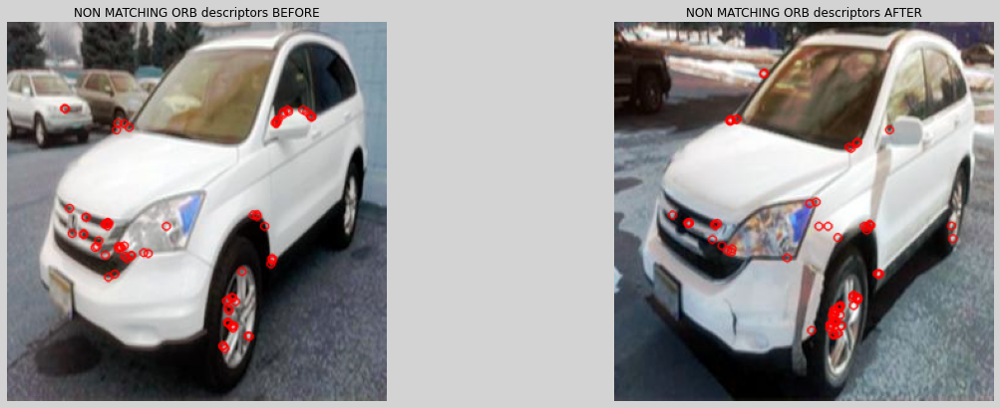

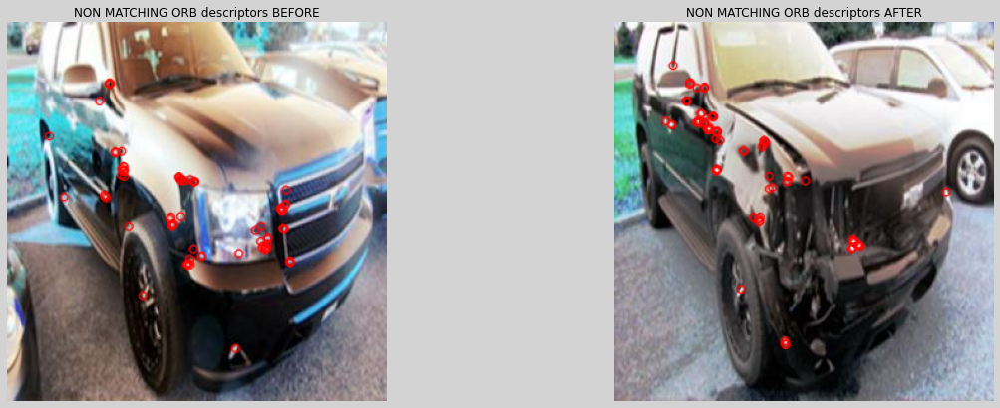

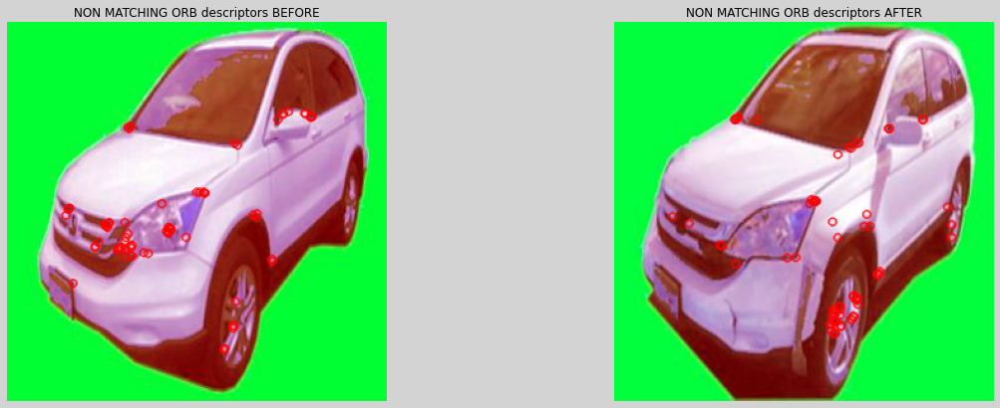

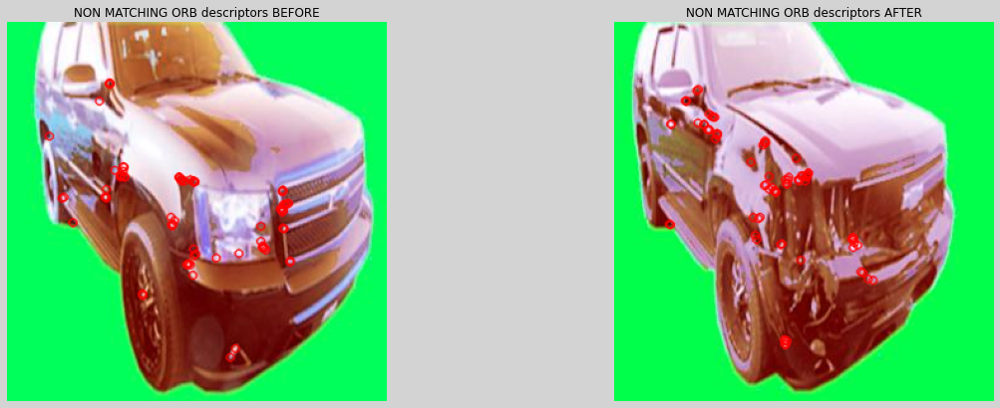

In [82]:
for i, j in enumerate(img_indexes):
    draw_non_matching_points(i, j, des_list_ORB, "")

---
---
# 4. Features extraction with *ORB* on images from `Preprocessing #2` **(canny)* <a class="anchor" id="feature_extraction2"></a> [⇪](#menu)

## 4.1 Feature `extraction` and image descriptors calculation <a class="anchor" id="fe_preprocessing2"></a> [⇪](#menu)

01
index: 01 | img_before: data/preprocessed/01_before_canny.jpg | img_after: data/preprocessed/01_after_canny.jpg


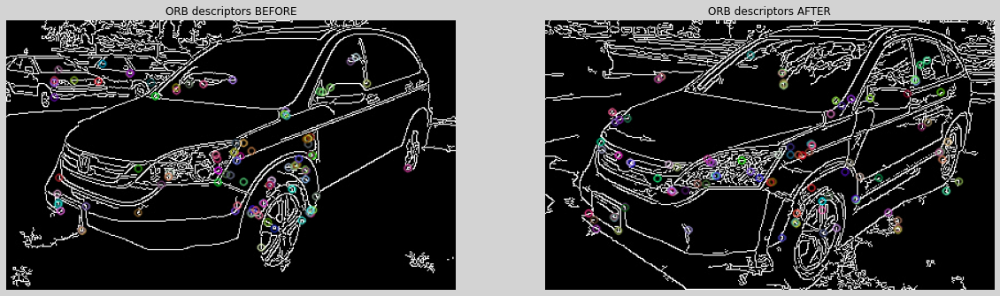

18
index: 18 | img_before: data/preprocessed/18_before_canny.jpg | img_after: data/preprocessed/18_after_canny.jpg


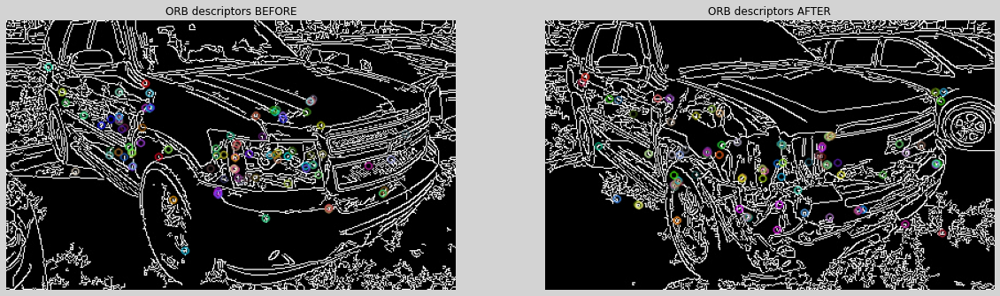

101
index: 101 | img_before: data/preprocessed/101_before_canny.jpg | img_after: data/preprocessed/101_after_canny.jpg


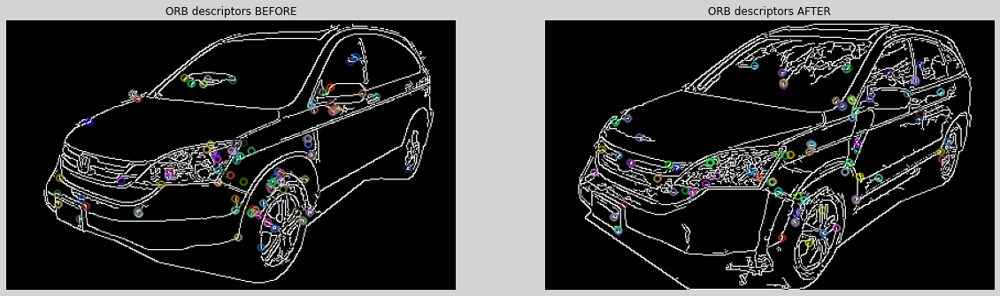

118
index: 118 | img_before: data/preprocessed/118_before_canny.jpg | img_after: data/preprocessed/118_after_canny.jpg


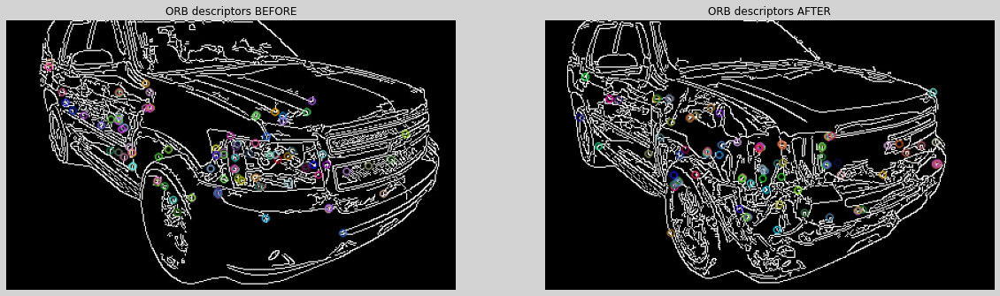

In [15]:
des_list_ORB_canny =[]

for i in img_indexes:
    print(i)
    
    # -- IMG Before
    img_before_path = pathlib.Path(preprocessed_path, f"{i}_before_canny.jpg")
    img_before = Image.open(img_before_path)
    
    mat_before = np.array(img_before)
    queryKeypointsORB_before, queryDescriptorsORB_before = orb.detectAndCompute(mat_before,None)
    
    # -- IMG After
    img_after_path = pathlib.Path(preprocessed_path, f"{i}_after_canny.jpg")
    img_after = Image.open(img_after_path)
    
    mat_after = np.array(img_after)
    queryKeypointsORB_after, queryDescriptorsORB_after = orb.detectAndCompute(mat_after,None)
    
    # -- Store data
    des_list_ORB_canny.append({'id':i, 'before':{'kp':queryKeypointsORB_before, 'desc':queryDescriptorsORB_before}, 'after':{'kp':queryKeypointsORB_after, 'desc':queryDescriptorsORB_after}})
    
    print(f"index: {i} | img_before: {img_before_path} | img_after: {img_after_path}")
    fig = plt.figure(figsize=(20,7), facecolor='lightgray')
        
    # -- Draw
    
    # draw only keypoints location,not size and orientation
    plt.subplot(1,2,1)
    plt.title("ORB descriptors BEFORE")
    #img_orb1 = cv2.drawKeypoints(mat, queryKeypointsORB_before, None, color=(0,255,0), flags=0)
    img_orb1 = cv2.drawKeypoints(mat_before, queryKeypointsORB_before, None, flags=2) #cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_orb1)
    plt.axis('off')
        
    plt.subplot(1,2,2)
    plt.title("ORB descriptors AFTER")
    #img_orb2 = cv2.drawKeypoints(mat, queryKeypointsORB_after, None, color=(0,255,0), flags=0)
    img_orb2 = cv2.drawKeypoints(mat_after, queryKeypointsORB_after, None, flags=2) #cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_orb2)
    plt.axis('off')
        
    plt.show()

## 4.2 Display `matching` descriptors <a class="anchor" id="dm_preprocessing2"></a> [⇪](#menu)

In [16]:
# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

In [17]:
matches_list = []

for i, row in enumerate(des_list_ORB_canny):
    matches = bf.match(des_list_ORB_canny[i]['before']['desc'], des_list_ORB_canny[i]['after']['desc'])
    # Sort them in the order of their distance.
    # matches = sorted(matches, key = lambda x:x.distance)
    matches_list.append(matches)

0 0


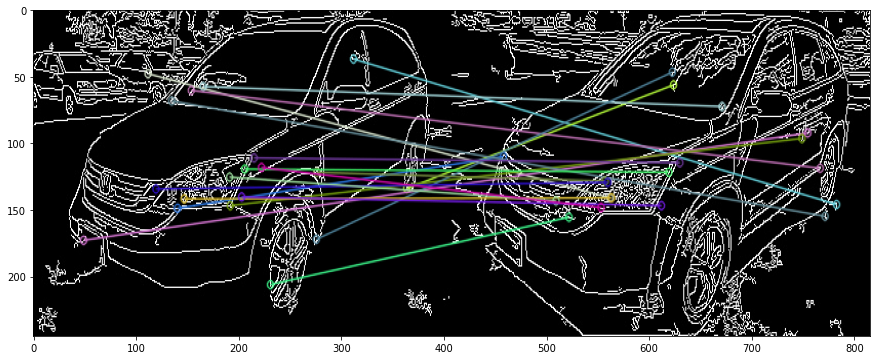

1 1


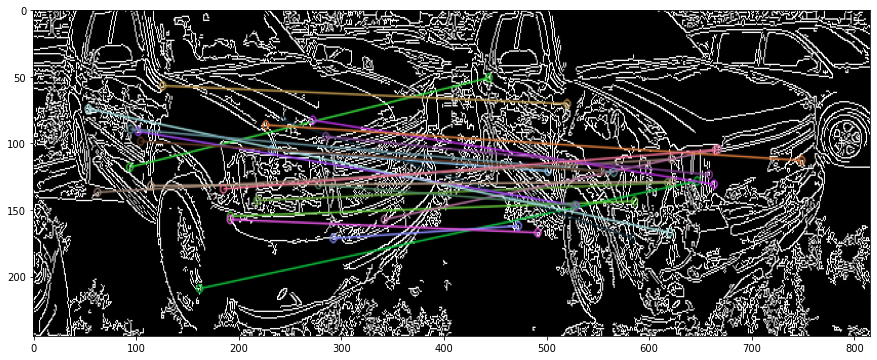

2 2


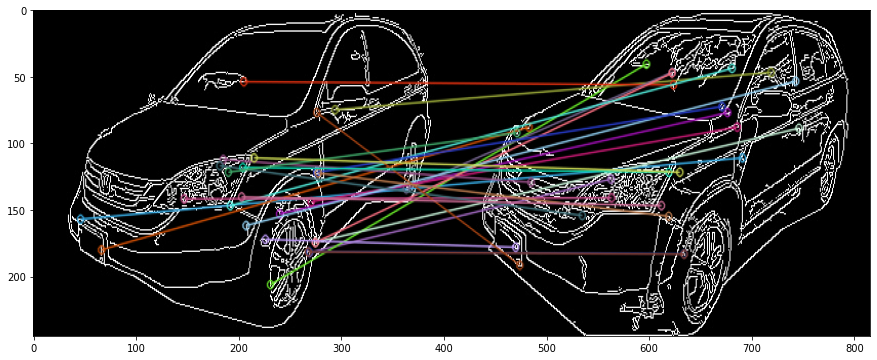

3 3


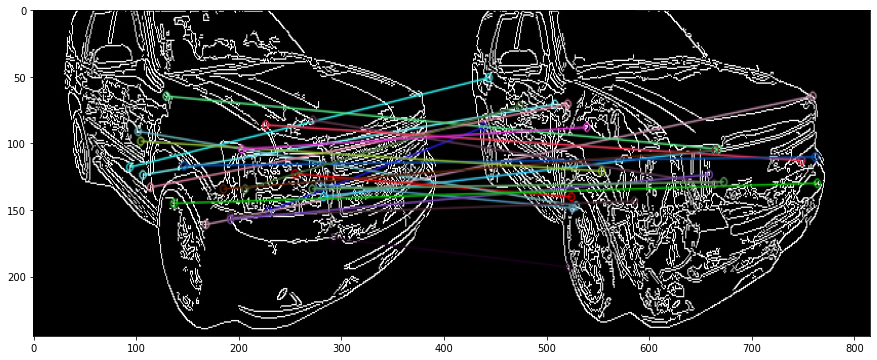

In [18]:
for i, j in enumerate(img_indexes):

    img_before = cv2.imread(str(pathlib.Path(preprocessed_path, f"{j}_before_canny.jpg")))
    img_after = cv2.imread(str(pathlib.Path(preprocessed_path, f"{j}_after_canny.jpg")))

    # Draw first 10 matches.
    img_similarities = cv2.drawMatches(img_before, des_list_ORB_canny[i]['before']['kp'], img_after, des_list_ORB_canny[i]['after']['kp'], matches_list[i][:100], None, flags=2)

    plt.figure(figsize = (15,6))
    plt.imshow(img_similarities, aspect='auto')
    plt.show()

## 4.2 Display `NON matching` descriptors <a class="anchor" id="dnm_preprocessing2"></a> [⇪](#menu)

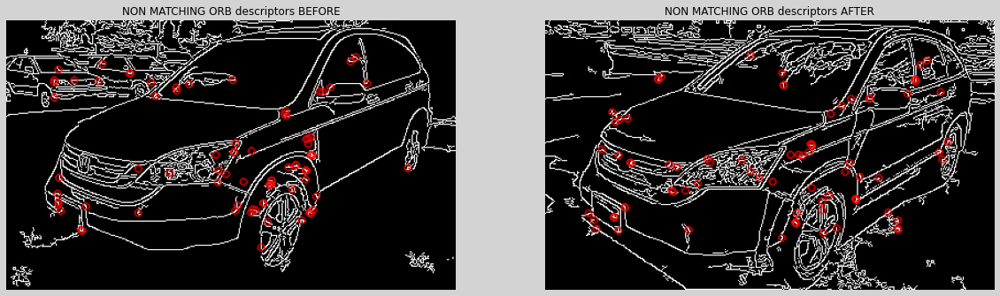

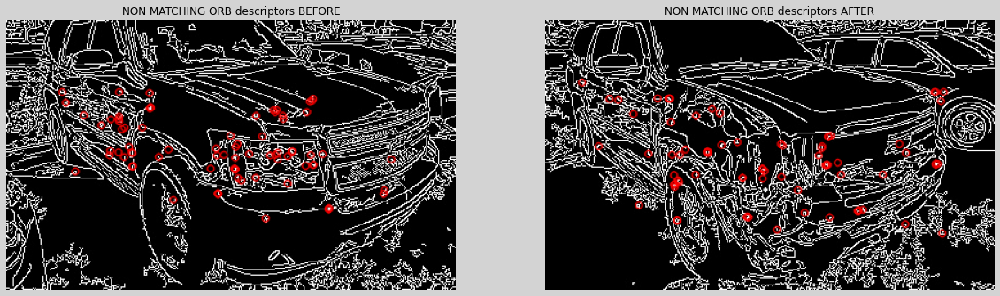

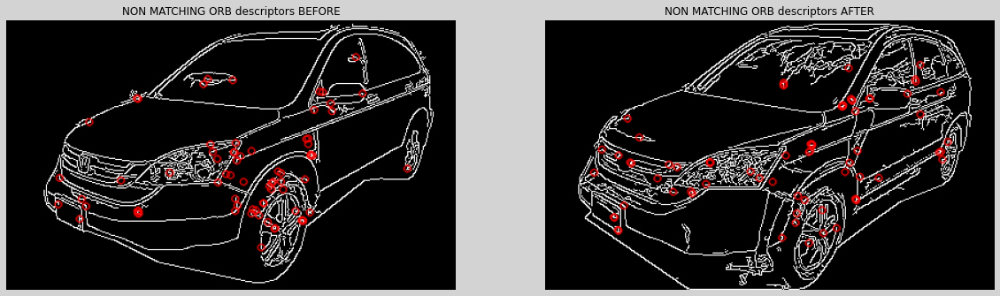

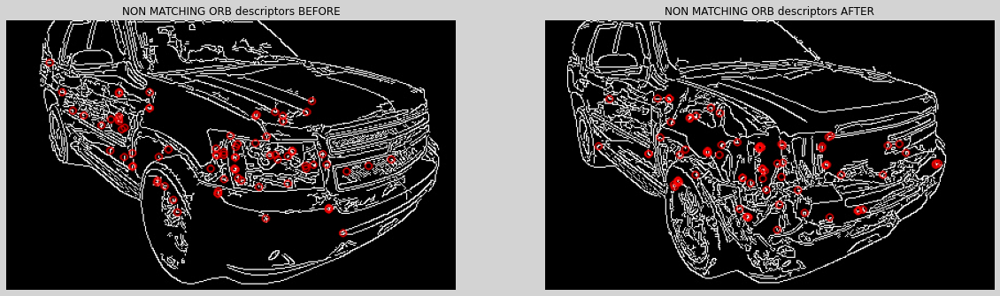

In [83]:
for i, j in enumerate(img_indexes):
    draw_non_matching_points(i, j, des_list_ORB_canny, "_canny")